In [1]:
# Data analysis and Manipulation
import plotly.graph_objs as go
import plotly.io as pio
import plotly.express as px
import pandas as pd

# Data Visualization
import matplotlib.pyplot as plt

# Importing Plotly
import plotly.offline as py
py.init_notebook_mode(connected=True)

# Initializing Plotly
pio.renderers.default = 'colab'

In [2]:
data=pd.read_csv("covid.csv")
data.head()

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,NaN,162804.0,NaN,2576668.0,NaN,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,NaN,98644.0,NaN,2047660.0,NaN,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,NaN,41638.0,NaN,1377384.0,NaN,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,NaN,14606.0,NaN,676357.0,NaN,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,NaN,9604.0,NaN,387316.0,NaN,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209 entries, 0 to 208
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country/Region    209 non-null    object 
 1   Continent         208 non-null    object 
 2   Population        208 non-null    float64
 3   TotalCases        209 non-null    int64  
 4   NewCases          4 non-null      float64
 5   TotalDeaths       188 non-null    float64
 6   NewDeaths         3 non-null      float64
 7   TotalRecovered    205 non-null    float64
 8   NewRecovered      3 non-null      float64
 9   ActiveCases       205 non-null    float64
 10  Serious,Critical  122 non-null    float64
 11  Tot Cases/1M pop  208 non-null    float64
 12  Deaths/1M pop     187 non-null    float64
 13  TotalTests        191 non-null    float64
 14  Tests/1M pop      191 non-null    float64
 15  WHO Region        184 non-null    object 
 16  iso_alpha         209 non-null    object 
dt

In [4]:
data1=pd.read_csv("covid_grouped.csv")
data1.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


In [5]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Date            35156 non-null  object
 1   Country/Region  35156 non-null  object
 2   Confirmed       35156 non-null  int64 
 3   Deaths          35156 non-null  int64 
 4   Recovered       35156 non-null  int64 
 5   Active          35156 non-null  int64 
 6   New cases       35156 non-null  int64 
 7   New deaths      35156 non-null  int64 
 8   New recovered   35156 non-null  int64 
 9   WHO Region      35156 non-null  object
 10  iso_alpha       35156 non-null  object
dtypes: int64(7), object(4)
memory usage: 3.0+ MB


In [6]:
data.columns

Index(['Country/Region', 'Continent', 'Population', 'TotalCases', 'NewCases',
       'TotalDeaths', 'NewDeaths', 'TotalRecovered', 'NewRecovered',
       'ActiveCases', 'Serious,Critical', 'Tot Cases/1M pop', 'Deaths/1M pop',
       'TotalTests', 'Tests/1M pop', 'WHO Region', 'iso_alpha'],
      dtype='object')

In [7]:
data.drop(['NewCases', 'NewDeaths', 'NewRecovered'],axis=1, inplace=True)
data.head()

,Country/Region,Continent,Population,TotalCases,TotalDeaths,TotalRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,162804.0,2576668.0,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,98644.0,2047660.0,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,41638.0,1377384.0,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,14606.0,676357.0,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,9604.0,387316.0,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


In [8]:
# Import create_table Figure Factory

from plotly.figure_factory import create_table

colorscale = [[0, '#4d004c'], [.5, '#f2e5ff'], [1, '#ffffff']]
table = create_table(data.head(15), colorscale=colorscale)
py.iplot(table)

In [9]:
px.bar(data.head(15), x = 'Country/Region',y = 'TotalCases',color = 'TotalCases',height = 500,hover_data = ['Country/Region', 'Continent'])

In [10]:
px.bar(data.head(15), x = 'Country/Region', y = 'TotalCases',color = 'TotalDeaths', height = 500,hover_data = ['Country/Region', 'Continent'])

In [11]:
px.bar(data.head(15), x = 'Country/Region', y = 'TotalCases',color = 'TotalRecovered', height = 500,hover_data = ['Country/Region', 'Continent'])

In [12]:
px.bar(data.head(15), x = 'Country/Region', y = 'TotalCases',color = 'TotalTests', height = 500, hover_data = ['Country/Region', 'Continent'])

In [13]:
px.bar(data.head(15), x = 'TotalTests', y = 'Country/Region',color = 'TotalTests',orientation ='h',  height = 500,hover_data = ['Country/Region', 'Continent'])

In [14]:
px.bar(data.head(15), x = 'TotalTests', y = 'Continent',color = 'TotalTests',orientation ='h',  height = 500,hover_data = ['Country/Region', 'Continent'])

In [15]:
px.scatter(data, x='Continent',y='TotalCases',hover_data=['Country/Region', 'Continent'],color='TotalCases', size='TotalCases', size_max=80)

In [16]:
px.scatter(data.head(50), x='Continent',y='TotalCases',hover_data=['Country/Region', 'Continent'],color='TotalCases', size='TotalCases', size_max=80, log_y=True)

In [17]:
px.scatter(data.head(100), x='Country/Region', y='TotalCases',hover_data=['Country/Region', 'Continent'],color='TotalCases', size='TotalCases', size_max=80)

In [18]:
px.scatter(data.head(30), x='Country/Region', y='TotalCases',hover_data=['Country/Region', 'Continent'],color='Country/Region', size='TotalCases', size_max=80, log_y=True)

In [19]:
px.scatter(data.head(10), x='Country/Region', y= 'TotalDeaths',hover_data=['Country/Region', 'Continent'],color='Country/Region', size= 'TotalDeaths', size_max=80)

In [20]:
px.scatter(data.head(30), x='Country/Region', y= 'Tests/1M pop',hover_data=['Country/Region', 'Continent'],color='Country/Region', size= 'Tests/1M pop', size_max=80)

In [21]:
px.scatter(data.head(30), x='Country/Region', y= 'Tests/1M pop',hover_data=['Country/Region', 'Continent'],color='Tests/1M pop', size= 'Tests/1M pop', size_max=80)

In [22]:
px.scatter(data.head(30), x='TotalCases', y= 'TotalDeaths',hover_data=['Country/Region', 'Continent'],color='TotalDeaths', size= 'TotalDeaths', size_max=80)

In [23]:
px.scatter(data.head(30), x='TotalCases', y= 'TotalDeaths',hover_data=['Country/Region', 'Continent'],color='TotalDeaths', size= 'TotalDeaths', size_max=80, log_x=True, log_y=True)

In [24]:
px.scatter(data.head(30), x='TotalTests', y= 'TotalCases',hover_data=['Country/Region', 'Continent'],color='TotalTests', size= 'TotalTests', size_max=80, log_x=True, log_y=True)

In [25]:
px.bar(data1, x="Date", y="Confirmed", color="Confirmed",hover_data=["Confirmed", "Date", "Country/Region"], height=400)

In [26]:
px.bar(data1, x="Date", y="Confirmed", color="Confirmed",hover_data=["Confirmed", "Date", "Country/Region"],log_y=True, height=400)

In [27]:
px.bar(data1, x="Date", y="Deaths", color="Deaths",hover_data=["Confirmed", "Date", "Country/Region"], height=400)

In [28]:
px.bar(data1, x="Date", y="Deaths", color="Deaths",hover_data=["Confirmed", "Date", "Country/Region"],log_y=True, height=400)

In [29]:
df_US= data1.loc[data1["Country/Region"]=="US"]

In [30]:
px.bar(df_US, x="Date", y="Confirmed", color="Confirmed", height=400)

In [31]:
px.bar(df_US,x="Date", y="Recovered", color="Recovered", height=400)

In [32]:
px.line(df_US,x="Date", y="Recovered", height=400)

In [33]:
px.line(df_US,x="Date", y="Deaths", height=400)

In [34]:
px.line(df_US,x="Date", y="Confirmed", height=400)

In [35]:
px.line(df_US,x="Date", y="New cases", height=400)

In [36]:
px.bar(df_US,x="Date", y="New cases", height=400)

In [37]:
px.scatter(df_US, x="Confirmed", y="Deaths", height=400)

In [38]:
px.choropleth(data1,locations="iso_alpha",color="Confirmed",hover_name="Country/Region",color_continuous_scale="Blues",animation_frame="Date")

In [39]:
px.choropleth(data1,locations='iso_alpha',color="Deaths",hover_name="Country/Region",color_continuous_scale="Viridis",animation_frame="Date" )

In [40]:
px.choropleth(data1,locations='iso_alpha',color="Recovered",hover_name="Country/Region",color_continuous_scale="RdYlGn",projection="natural earth",animation_frame="Date" )

In [47]:
px.bar(data1, x="WHO Region", y="Confirmed", color="WHO Region",animation_frame="Date", hover_name="Country/Region")

In [48]:
data2= pd.read_csv("coviddeath.csv")
data2.head()

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
0,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,0-24,122.0,NaN
1,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,25-34,596.0,NaN
2,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,35-44,1521.0,NaN
3,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,45-54,4186.0,NaN
4,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,55-64,10014.0,NaN


In [49]:
data2.shape

(12260, 10)

In [51]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12260 entries, 0 to 12259
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Data as of                 12260 non-null  object 
 1   Start Week                 12260 non-null  object 
 2   End Week                   12260 non-null  object 
 3   State                      12260 non-null  object 
 4   Condition Group            12260 non-null  object 
 5   Condition                  12260 non-null  object 
 6   ICD10_codes                12260 non-null  object 
 7   Age Group                  12260 non-null  object 
 8   Number of COVID-19 Deaths  5354 non-null   float64
 9   Flag                       6906 non-null   object 
dtypes: float64(1), object(9)
memory usage: 957.9+ KB


In [52]:
data2.groupby(["Condition"]).count()

,Data as of,Start Week,End Week,State,Condition Group,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
Condition,,,,,,,,,
Adult respiratory distress syndrome,540,540,540,540,540,540,540,272,268
All other conditions and causes (residual),540,540,540,540,540,540,540,363,177
Alzheimer disease,530,530,530,530,530,530,530,144,386
COVID-19,540,540,540,540,540,540,540,377,163
Cardiac arrest,520,520,520,520,520,520,520,219,301
Cardiac arrhythmia,540,540,540,540,540,540,540,192,348
Cerebrovascular diseases,530,530,530,530,530,530,530,187,343
Chronic lower respiratory diseases,540,540,540,540,540,540,540,229,311
Diabetes,540,540,540,540,540,540,540,276,264


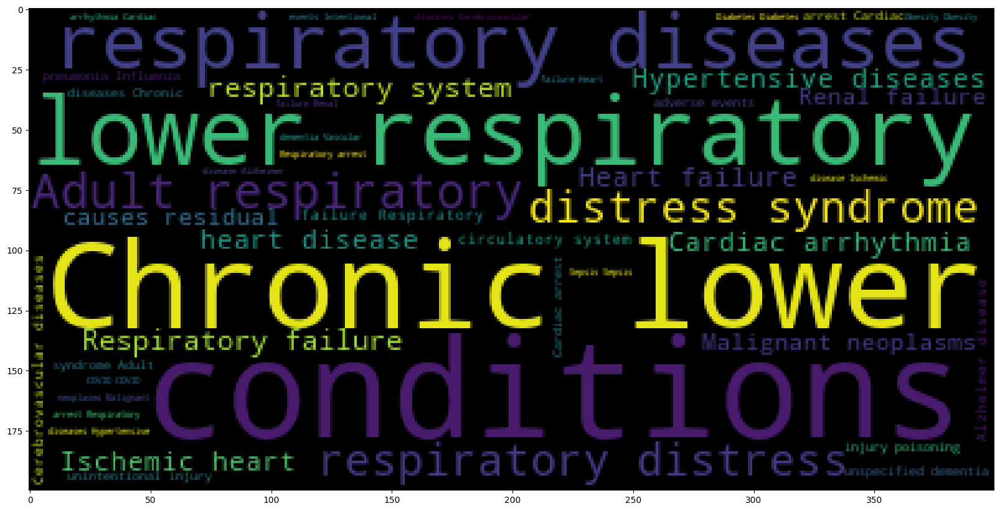

In [55]:
# import word cloud
from wordcloud import WordCloud

sentences = data2["Condition"].tolist()
sentences_as_a_string = ' '.join(sentences)


# Convert the string into WordCloud
plt.figure(figsize=(20, 20))
plt.imshow(WordCloud().generate(sentences_as_a_string))

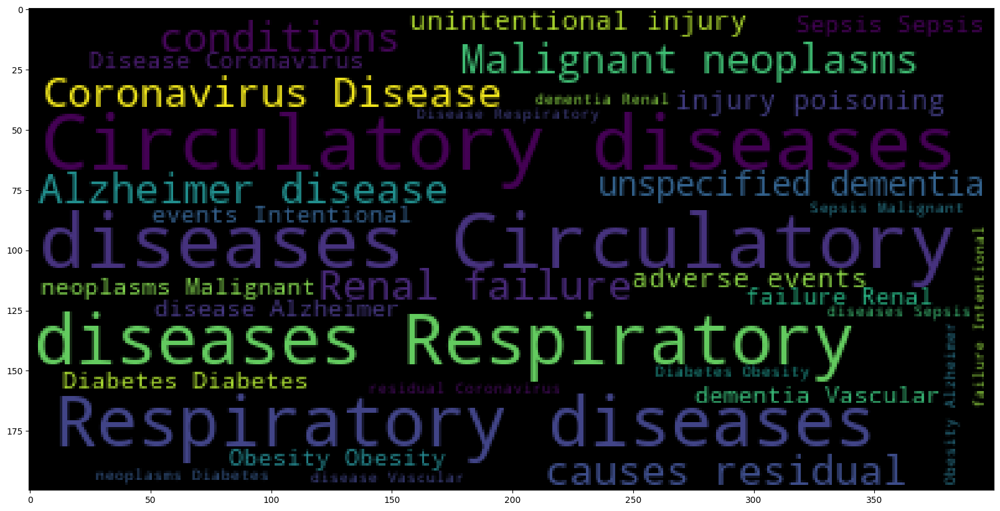

In [56]:
column2_tolist= data2["Condition Group"].tolist()

# Convert the list to one single string
column_to_string= " ".join(column2_tolist)

# Convert the string into WordCloud
plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(column_to_string))